# Image Colourization using GANs

In [2]:
# Import Libraries

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
from torchvision import transforms
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image
import random
from tqdm import tqdm
import time

In [3]:
# Download Dataset
import kagglehub

path = kagglehub.dataset_download("rhtsingh/google-universal-image-embeddings-128x128") # Download latest version

path += "/128x128"

print("Path to dataset files:", path)

# path = "/dataset" # Paste path to dataset containing images in folders

Path to dataset files: /kaggle/input/google-universal-image-embeddings-128x128/128x128


In [4]:
# ========== LAB COLOR UTILITIES ==========
from skimage import color

def to_numpy(x):
    if isinstance(x, torch.Tensor):
        return x.detach().cpu().numpy()
    return x

def lab_to_rgb(L, ab):
    L = to_numpy(L)
    ab = to_numpy(ab)
    if L.ndim == 3 and L.shape[0] == 1:
        L = L[0]
    if ab.shape[0] == 2:
        ab = ab.transpose(1, 2, 0)
    # Make sure both L and ab are NumPy and of the same dtype
    L = np.array(L, dtype=np.float32)
    ab = np.array(ab, dtype=np.float32)
    lab = np.zeros((L.shape[0], L.shape[1], 3), dtype=np.float32)
    lab[:, :, 0] = L * 100
    lab[:, :, 1:] = ab * 128
    rgb = color.lab2rgb(lab)
    rgb = np.clip(rgb, 0, 1)
    return rgb

def rgb_to_lab(img):
    # Ensure the input is a NumPy array before passing to skimage
    if isinstance(img, torch.Tensor):
        img = img.numpy()
    lab = color.rgb2lab(img)
    L = lab[:, :, 0] / 100.0
    ab = lab[:, :, 1:] / 128.0
    return torch.tensor(L).unsqueeze(0), torch.tensor(ab).permute(2, 0, 1)


In [5]:
# ========== Dataset Prepartion ==========
class LABColorizationDataset(torch.utils.data.Dataset):
    def __init__(self, root_dir, transform):
        self.image_paths = []
        for class_folder in os.listdir(root_dir):
            class_folder_path = os.path.join(root_dir, class_folder)
            if os.path.isdir(class_folder_path):
                for img_name in os.listdir(class_folder_path):
                    self.image_paths.append(os.path.join(class_folder_path, img_name))
        self.transform = transform

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        img = Image.open(img_path).convert("RGB")

        img = self.transform(img)  # Resize and convert to tensor
        img_np = img.permute(1, 2, 0).numpy()  # (H, W, C)

        from skimage import color
        lab = color.rgb2lab(img_np).astype("float32")
        L = lab[:, :, 0] / 100.0
        ab = lab[:, :, 1:] / 128.0

        L = torch.from_numpy(L).unsqueeze(0)        # (1, H, W)
        ab = torch.from_numpy(ab).permute(2, 0, 1)  # (2, H, W)
        return L, ab

    def __len__(self):
        return len(self.image_paths)


In [6]:
# Dataset and Split
transform_resize = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor()
])

dataset = LABColorizationDataset(
    root_dir=path,
    transform=transform_resize
)

train_size = int(0.9 * len(dataset))
test_size = len(dataset) - train_size
train_ds, test_ds = random_split(dataset, [train_size, test_size])

# train_loader = DataLoader(train_ds, batch_size=128, shuffle=True, pin_memory=True, num_workers=6)
# test_loader = DataLoader(test_ds, batch_size=64, shuffle=False, pin_memory=True, num_workers=6)

# For A100 GPU
train_loader = DataLoader(
    train_ds,
    batch_size=256,
    shuffle=True,
    num_workers=16,
    pin_memory=True,
    prefetch_factor=4,
    persistent_workers=True
)

test_loader = DataLoader(
    test_ds,
    batch_size=128,
    shuffle=False,
    num_workers=8,
    pin_memory=True,
    prefetch_factor=4,
    persistent_workers=True
)

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [7]:
print(f"Number of training samples: {len(train_ds)}")
print(f"Number of test samples: {len(test_ds)}")

Number of training samples: 119275
Number of test samples: 13253


### Define GAN Architecture

In [8]:
class GeneratorUNet(nn.Module):
    def __init__(self):
        super().__init__()
        def CBR(in_ch, out_ch): return nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1), nn.BatchNorm2d(out_ch), nn.ReLU())

        self.enc1 = CBR(1, 64)
        self.enc2 = CBR(64, 128)
        self.enc3 = CBR(128, 256)
        self.enc4 = CBR(256, 512)

        self.pool = nn.MaxPool2d(2, 2)

        self.up1 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec1 = CBR(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = CBR(256, 128)
        self.up3 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec3 = CBR(128, 64)

        self.final = nn.Conv2d(64, 2, kernel_size=1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))

        d1 = self.up1(e4)
        d1 = self.dec1(torch.cat([d1, e3], dim=1))
        d2 = self.up2(d1)
        d2 = self.dec2(torch.cat([d2, e2], dim=1))
        d3 = self.up3(d2)
        d3 = self.dec3(torch.cat([d3, e1], dim=1))

        return torch.tanh(self.final(d3))

class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        def block(in_ch, out_ch, norm=True):
            layers = [nn.Conv2d(in_ch, out_ch, 4, stride=2, padding=1)]
            if norm:
                layers.append(nn.BatchNorm2d(out_ch))
            layers.append(nn.LeakyReLU(0.2))
            return nn.Sequential(*layers)

        self.model = nn.Sequential(
            block(3, 64, norm=False),
            block(64, 128),
            block(128, 256),
            block(256, 512),
            nn.Conv2d(512, 1, 4, padding=1)  # Output: PatchGAN style
        )

    def forward(self, L, ab):
        x = torch.cat([L, ab], dim=1)  # input is (L + ab) = 3 channels
        return self.model(x)


In [9]:
device = torch.device("mps" if torch.backends.mps.is_available() else ("cuda" if torch.cuda.is_available() else "cpu"))
print("Using device:", device)

Using device: cuda


### Loss and Training Loop

In [10]:
# Visualize predictions
def visualize_predictions(model, test_dataset, device, num_samples=5):
    model.eval()
    with torch.no_grad():
        samples = random.sample(list(test_dataset), num_samples)
        plt.figure(figsize=(15, 9))
        for i in range(num_samples):
            L = samples[i][0].unsqueeze(0).to(device)  # shape: (1, 1, H, W)
            true_ab = samples[i][1].to(device)         # shape: (2, H, W)

            pred_ab = model(L).squeeze(0).cpu()         # (2, H, W)
            L_cpu = L.cpu().squeeze(0).squeeze(0)       # (H, W)

            recon_true = lab_to_rgb(L_cpu, true_ab.cpu())
            recon_pred = lab_to_rgb(L_cpu, pred_ab)

            # Plot grayscale input
            plt.subplot(3, num_samples, i + 1)
            plt.imshow(L_cpu, cmap='gray')
            plt.axis('off')
            plt.title("Grayscale")

            # Plot original color image
            plt.subplot(3, num_samples, i + 1 + num_samples)
            plt.imshow(recon_true)
            plt.axis('off')
            plt.title("Original")

            # Plot predicted image
            plt.subplot(3, num_samples, i + 1 + 2 * num_samples)
            plt.imshow(recon_pred)
            plt.axis('off')
            plt.title("Colorized")

        plt.tight_layout()
        plt.show()


In [11]:
# Hyperparameters

G = GeneratorUNet().to(device)
D = Discriminator().to(device)

criterion_GAN = nn.BCEWithLogitsLoss()
criterion_L1 = nn.L1Loss()

optimizer_G = torch.optim.Adam(G.parameters(), lr=2e-4, betas=(0.5, 0.999))
optimizer_D = torch.optim.Adam(D.parameters(), lr=1e-4, betas=(0.5, 0.999))

epochs = 50

Epoch 1/50: 100%|██████████| 466/466 [02:41<00:00,  2.89it/s, D_Loss=0.249, G_Loss=10.8]


[Epoch 1] G_Loss: 10.2531, D_Loss: 0.8224


Epoch 2/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.758, G_Loss=8.24]


[Epoch 2] G_Loss: 8.8720, D_Loss: 1.0153


Epoch 3/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=1.03, G_Loss=8.95]


[Epoch 3] G_Loss: 8.7460, D_Loss: 1.0225


Epoch 4/50: 100%|██████████| 466/466 [02:37<00:00,  2.97it/s, D_Loss=1.14, G_Loss=8.67]


[Epoch 4] G_Loss: 8.6014, D_Loss: 1.0555


Epoch 5/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.961, G_Loss=7.68]


[Epoch 5] G_Loss: 8.2842, D_Loss: 1.1052


Epoch 6/50: 100%|██████████| 466/466 [02:37<00:00,  2.97it/s, D_Loss=1.1, G_Loss=8.48]


[Epoch 6] G_Loss: 8.2248, D_Loss: 1.1171


Epoch 7/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.967, G_Loss=7.89]


[Epoch 7] G_Loss: 8.2807, D_Loss: 1.0895


Epoch 8/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=1.42, G_Loss=8.26]


[Epoch 8] G_Loss: 8.2759, D_Loss: 1.0744


Epoch 9/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=1.08, G_Loss=7.96]


[Epoch 9] G_Loss: 8.3973, D_Loss: 1.0455


Epoch 10/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=1.13, G_Loss=7.98]


Visualizing predictions at epoch 10


/tmp/ipython-input-1801284097.py:22: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 1 negative Z values that have been clipped to zero
  rgb = color.lab2rgb(lab)


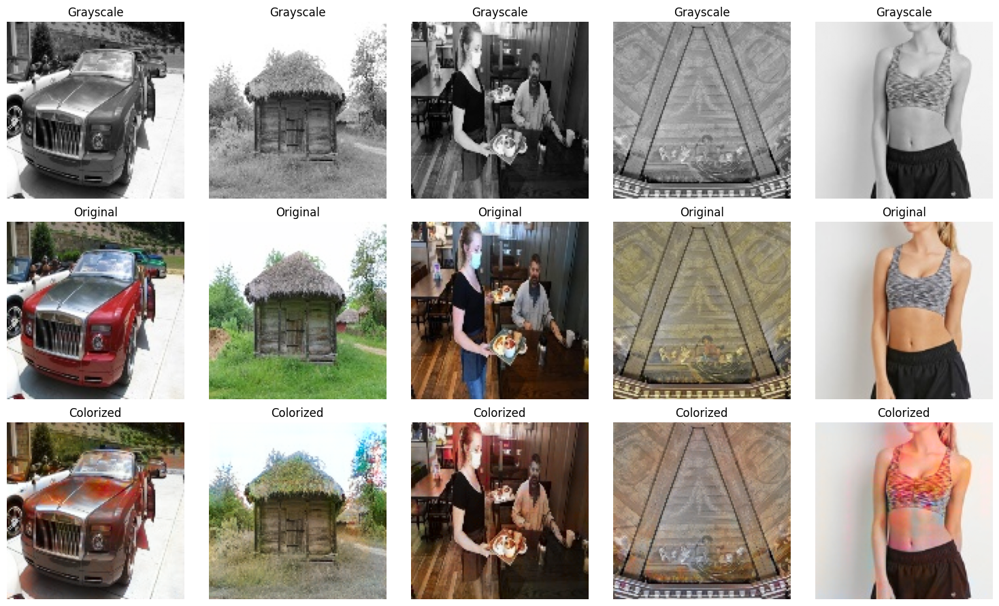

[Epoch 10] G_Loss: 8.4951, D_Loss: 1.0074


Epoch 11/50: 100%|██████████| 466/466 [02:37<00:00,  2.97it/s, D_Loss=1.32, G_Loss=8.09]


[Epoch 11] G_Loss: 8.3949, D_Loss: 1.0131


Epoch 12/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=1.02, G_Loss=9.19]


[Epoch 12] G_Loss: 8.4509, D_Loss: 0.9925


Epoch 13/50: 100%|██████████| 466/466 [02:37<00:00,  2.96it/s, D_Loss=0.746, G_Loss=8.52]


[Epoch 13] G_Loss: 8.5491, D_Loss: 0.9517


Epoch 14/50: 100%|██████████| 466/466 [02:37<00:00,  2.97it/s, D_Loss=1.14, G_Loss=8.59]


[Epoch 14] G_Loss: 8.6046, D_Loss: 0.9207


Epoch 15/50: 100%|██████████| 466/466 [02:37<00:00,  2.97it/s, D_Loss=1.13, G_Loss=7.5]


[Epoch 15] G_Loss: 8.3497, D_Loss: 0.9884


Epoch 16/50: 100%|██████████| 466/466 [02:37<00:00,  2.97it/s, D_Loss=0.973, G_Loss=8.18]


[Epoch 16] G_Loss: 8.5396, D_Loss: 0.9399


Epoch 17/50: 100%|██████████| 466/466 [02:37<00:00,  2.97it/s, D_Loss=1.5, G_Loss=9.33]


[Epoch 17] G_Loss: 8.4929, D_Loss: 0.9345


Epoch 18/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.823, G_Loss=8.19]


[Epoch 18] G_Loss: 8.5635, D_Loss: 0.9126


Epoch 19/50: 100%|██████████| 466/466 [02:37<00:00,  2.97it/s, D_Loss=1.11, G_Loss=7.8]


[Epoch 19] G_Loss: 8.6102, D_Loss: 0.8907


Epoch 20/50: 100%|██████████| 466/466 [02:37<00:00,  2.97it/s, D_Loss=0.553, G_Loss=9.36]


Visualizing predictions at epoch 20


/tmp/ipython-input-1801284097.py:22: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 7 negative Z values that have been clipped to zero
  rgb = color.lab2rgb(lab)
/tmp/ipython-input-1801284097.py:22: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 10 negative Z values that have been clipped to zero
  rgb = color.lab2rgb(lab)


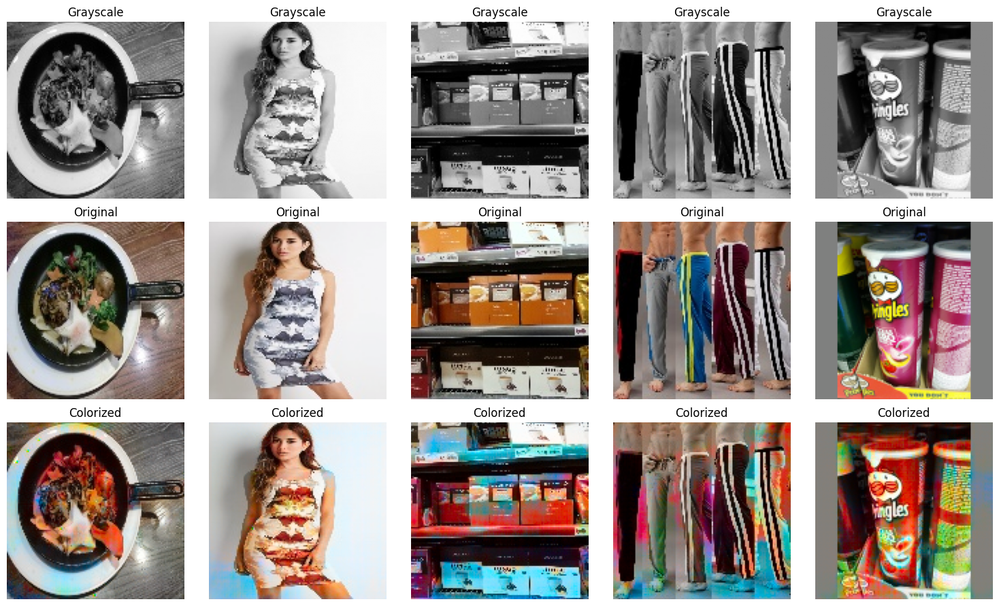

[Epoch 20] G_Loss: 8.5967, D_Loss: 0.8890


Epoch 21/50: 100%|██████████| 466/466 [02:37<00:00,  2.97it/s, D_Loss=0.931, G_Loss=8.62]


[Epoch 21] G_Loss: 8.7263, D_Loss: 0.8413


Epoch 22/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.559, G_Loss=9.3]


[Epoch 22] G_Loss: 8.7139, D_Loss: 0.8480


Epoch 23/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.556, G_Loss=9.08]


[Epoch 23] G_Loss: 8.7505, D_Loss: 0.8295


Epoch 24/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.564, G_Loss=8.79]


[Epoch 24] G_Loss: 8.8184, D_Loss: 0.8146


Epoch 25/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=1.02, G_Loss=9.53]


[Epoch 25] G_Loss: 8.8499, D_Loss: 0.7927


Epoch 26/50: 100%|██████████| 466/466 [02:37<00:00,  2.97it/s, D_Loss=0.761, G_Loss=8.44]


[Epoch 26] G_Loss: 8.9671, D_Loss: 0.7709


Epoch 27/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.648, G_Loss=9.48]


[Epoch 27] G_Loss: 8.9408, D_Loss: 0.7675


Epoch 28/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.579, G_Loss=8.95]


[Epoch 28] G_Loss: 8.9519, D_Loss: 0.7723


Epoch 29/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.938, G_Loss=9.05]


[Epoch 29] G_Loss: 9.0481, D_Loss: 0.7078


Epoch 30/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.716, G_Loss=9.01]


Visualizing predictions at epoch 30


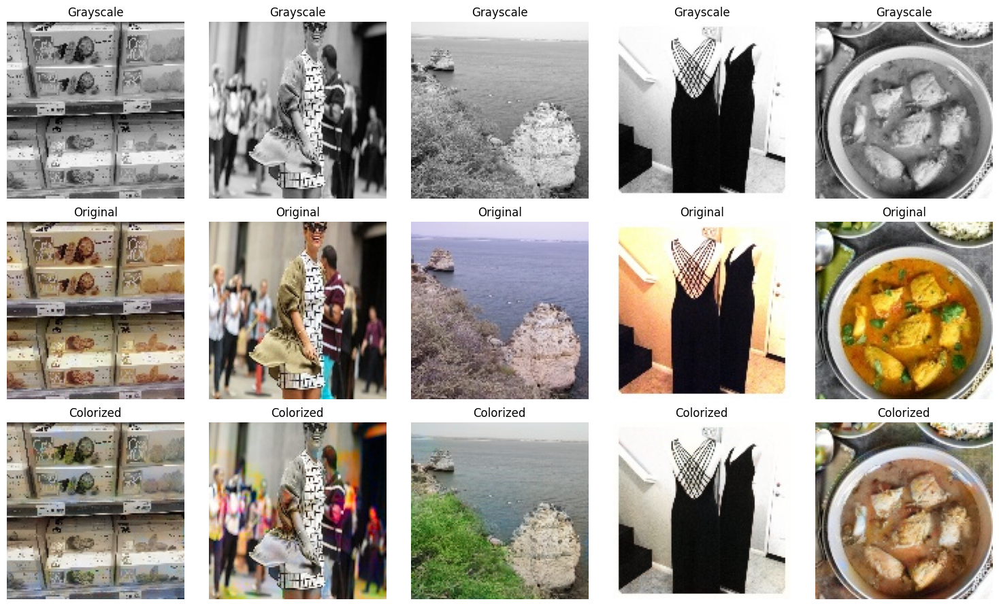

[Epoch 30] G_Loss: 9.2393, D_Loss: 0.6753


Epoch 31/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.676, G_Loss=9.97]


[Epoch 31] G_Loss: 9.2565, D_Loss: 0.6941


Epoch 32/50: 100%|██████████| 466/466 [02:37<00:00,  2.96it/s, D_Loss=0.835, G_Loss=8.13]


[Epoch 32] G_Loss: 9.0551, D_Loss: 0.7160


Epoch 33/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.828, G_Loss=8.45]


[Epoch 33] G_Loss: 9.1579, D_Loss: 0.7251


Epoch 34/50: 100%|██████████| 466/466 [02:37<00:00,  2.97it/s, D_Loss=0.63, G_Loss=9.18]


[Epoch 34] G_Loss: 9.2406, D_Loss: 0.6764


Epoch 35/50: 100%|██████████| 466/466 [02:37<00:00,  2.96it/s, D_Loss=0.48, G_Loss=8.71]


[Epoch 35] G_Loss: 9.3083, D_Loss: 0.6540


Epoch 36/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.737, G_Loss=8.79]


[Epoch 36] G_Loss: 9.3310, D_Loss: 0.6462


Epoch 37/50: 100%|██████████| 466/466 [02:37<00:00,  2.96it/s, D_Loss=0.798, G_Loss=8.37]


[Epoch 37] G_Loss: 9.4036, D_Loss: 0.6461


Epoch 38/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.483, G_Loss=10.5]


[Epoch 38] G_Loss: 9.4755, D_Loss: 0.6055


Epoch 39/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.414, G_Loss=9.54]


[Epoch 39] G_Loss: 9.4596, D_Loss: 0.6438


Epoch 40/50: 100%|██████████| 466/466 [02:37<00:00,  2.97it/s, D_Loss=0.545, G_Loss=9.81]


Visualizing predictions at epoch 40


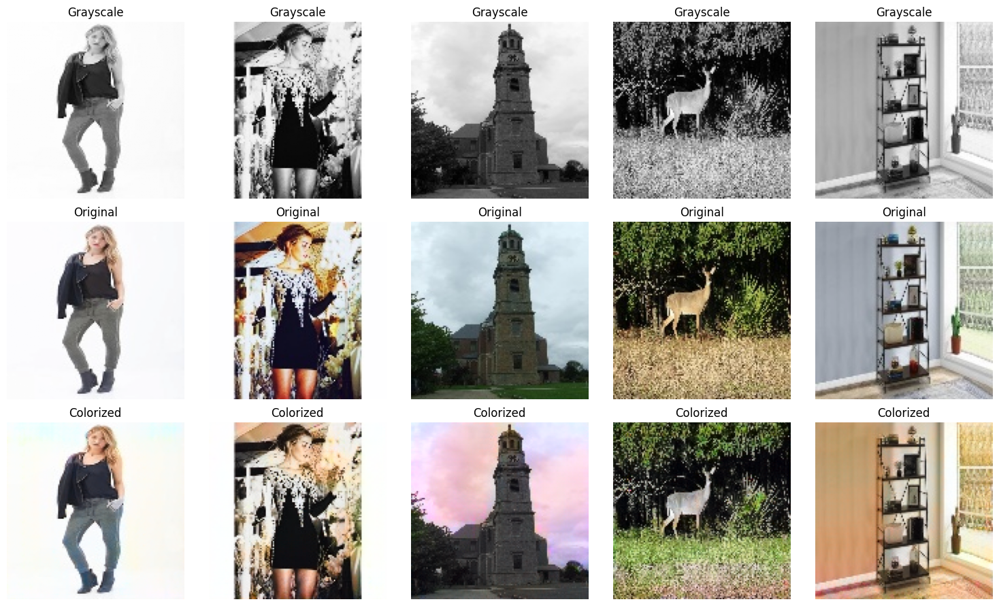

[Epoch 40] G_Loss: 9.5182, D_Loss: 0.5917


Epoch 41/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.433, G_Loss=9.79]


[Epoch 41] G_Loss: 9.6558, D_Loss: 0.5537


Epoch 42/50: 100%|██████████| 466/466 [02:37<00:00,  2.96it/s, D_Loss=0.292, G_Loss=9.63]


[Epoch 42] G_Loss: 9.6729, D_Loss: 0.5587


Epoch 43/50: 100%|██████████| 466/466 [02:37<00:00,  2.96it/s, D_Loss=0.782, G_Loss=10.7]


[Epoch 43] G_Loss: 9.7742, D_Loss: 0.5775


Epoch 44/50: 100%|██████████| 466/466 [02:37<00:00,  2.96it/s, D_Loss=0.396, G_Loss=10.1]


[Epoch 44] G_Loss: 9.6619, D_Loss: 0.5783


Epoch 45/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.561, G_Loss=9.8]


[Epoch 45] G_Loss: 9.6443, D_Loss: 0.5562


Epoch 46/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.246, G_Loss=9.07]


[Epoch 46] G_Loss: 9.7315, D_Loss: 0.5541


Epoch 47/50: 100%|██████████| 466/466 [02:37<00:00,  2.97it/s, D_Loss=0.161, G_Loss=11]


[Epoch 47] G_Loss: 9.7352, D_Loss: 0.5517


Epoch 48/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.195, G_Loss=11.2]


[Epoch 48] G_Loss: 10.1684, D_Loss: 0.4599


Epoch 49/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.343, G_Loss=10.8]


[Epoch 49] G_Loss: 9.9881, D_Loss: 0.5031


Epoch 50/50: 100%|██████████| 466/466 [02:36<00:00,  2.97it/s, D_Loss=0.329, G_Loss=9.46]


Visualizing predictions at epoch 50


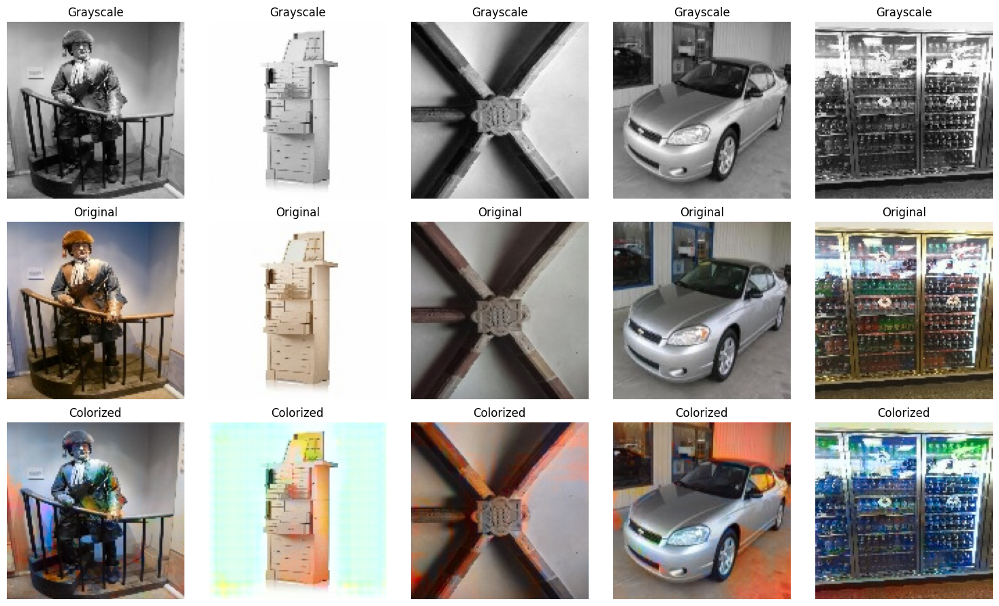

[Epoch 50] G_Loss: 10.0928, D_Loss: 0.4923


In [12]:
# Training Loop

g_losses = []
d_losses = []

for epoch in range(epochs):
    G.train()
    D.train()
    g_loss_running, d_loss_running = 0.0, 0.0

    loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}")

    for L, ab in loop:
        L, ab = L.to(device), ab.to(device)
        real_labels = torch.ones((L.size(0), 1, 14, 14), device=device)
        fake_labels = torch.zeros((L.size(0), 1, 14, 14), device=device)

        # ---- Train Discriminator ----
        optimizer_D.zero_grad()
        pred_ab = G(L).detach()
        real_output = D(L, ab)
        fake_output = D(L, pred_ab)

        # Match label shapes to output shapes
        real_labels = torch.ones_like(real_output)
        fake_labels = torch.zeros_like(fake_output)

        d_loss = criterion_GAN(real_output, real_labels) + criterion_GAN(fake_output, fake_labels)
        d_loss.backward()
        optimizer_D.step()

        # ---- Train Generator ----
        optimizer_G.zero_grad()
        fake_ab = G(L)
        output = D(L, fake_ab)
        g_adv_loss = criterion_GAN(output, real_labels)
        g_l1_loss = criterion_L1(fake_ab, ab)
        g_loss = g_adv_loss + 100 * g_l1_loss
        g_loss.backward()
        optimizer_G.step()

        g_loss_running += g_loss.item()
        d_loss_running += d_loss.item()

        loop.set_postfix(G_Loss=g_loss.item(), D_Loss=d_loss.item())

        ## End of For loop

    g_losses.append(g_loss_running/len(train_loader))
    d_losses.append(d_loss_running/len(train_loader))

    if (epoch + 1) % 10 == 0:
      print(f"Visualizing predictions at epoch {epoch+1}")
      visualize_predictions(G, test_ds, device)

    print(f"[Epoch {epoch+1}] G_Loss: {g_loss_running/len(train_loader):.4f}, D_Loss: {d_loss_running/len(train_loader):.4f}")

    torch.save(G.state_dict(), "color_GAN_generator.pth")


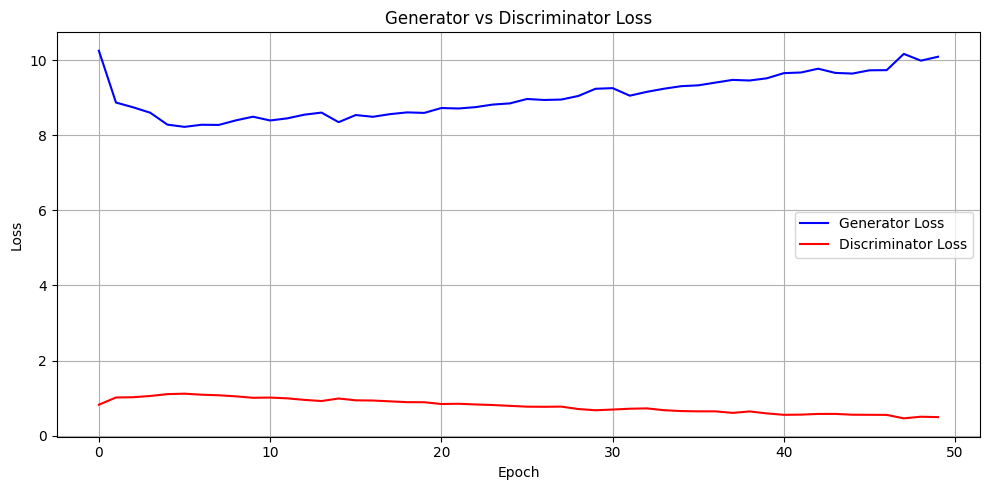

In [13]:
# Plot Generator and Discriminator Loss

plt.figure(figsize=(10, 5))
plt.plot(g_losses, label="Generator Loss", color="blue")
plt.plot(d_losses, label="Discriminator Loss", color="red")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Generator vs Discriminator Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

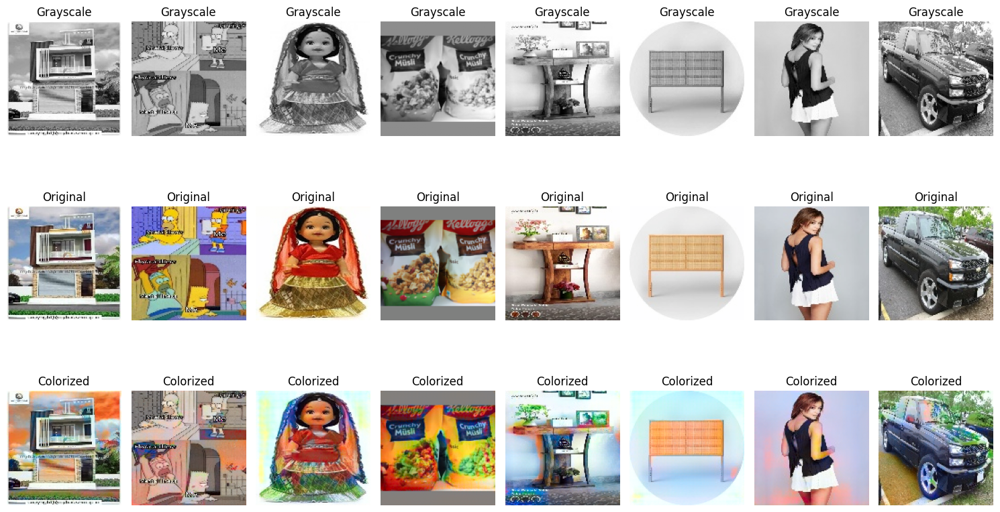

In [14]:
# Final Visualization

G.load_state_dict(torch.load("color_GAN_generator.pth"))

visualize_predictions(G, test_ds, device, num_samples=8)

